# GANomaly
- 2020.08.16 : gen 20 / lr 1e-2

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-2

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_data_root = "../../dataset/train/train_CFRP"

data_set = dataset.ImageFolder(root = CFRP_data_root, #data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 152
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 20)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/2]
- D_loss : 1.3957 / DC_loss : 0.6971
- D(x):0.5042 / D(DC(z1)) : 0.5087 / D(DC(z2)) : 0.4980
[1/100][1/2]
- D_loss : 1.7869 / DC_loss : 0.3761
- D(x):0.3499 / D(DC(z1)) : 0.5077 / D(DC(z2)) : 0.6865
[2/100][0/2]
- D_loss : 2.0971 / DC_loss : 0.4216
- D(x):0.3974 / D(DC(z1)) : 0.6875 / D(DC(z2)) : 0.6560
[2/100][1/2]
- D_loss : 1.6902 / DC_loss : 0.8815
- D(x):0.5427 / D(DC(z1)) : 0.6562 / D(DC(z2)) : 0.4141
[3/100][0/2]
- D_loss : 1.5419 / DC_loss : 0.6731
- D(x):0.3657 / D(DC(z1)) : 0.4146 / D(DC(z2)) : 0.5101
[3/100][1/2]
- D_loss : 1.3974 / DC_loss : 0.6103
- D(x):0.5048 / D(DC(z1)) : 0.5102 / D(DC(z2)) : 0.5432
[4/100][0/2]
- D_loss : 1.4040 / DC_loss : 0.6418
- D(x):0.5381 / D(DC(z1)) : 0.5435 / D(DC(z2)) : 0.5264
[4/100][1/2]
- D_loss : 1.4245 / DC_loss : 0.7528
- D(x):0.5083 / D(DC(z1)) : 0.5266 / D(DC(z2)) : 0.4711
[5/100][0/2]
- D_loss : 1.3898 / DC_loss : 0.7270
- D(x):0.4711 / D(DC(z1)) : 0.4711 / D(DC(z2)) : 0.4833
[5/100][1/2]
- D_loss : 1.3919 / DC_loss : 0.6

[39/100][1/2]
- D_loss : 1.3863 / DC_loss : 0.6933
- D(x):0.5009 / D(DC(z1)) : 0.5010 / D(DC(z2)) : 0.4999
[40/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6939
- D(x):0.4999 / D(DC(z1)) : 0.4999 / D(DC(z2)) : 0.4996
[40/100][1/2]
- D_loss : 1.3863 / DC_loss : 0.6927
- D(x):0.4996 / D(DC(z1)) : 0.4996 / D(DC(z2)) : 0.5002
[41/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6938
- D(x):0.5002 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.4997
[41/100][1/2]
- D_loss : 1.3863 / DC_loss : 0.6915
- D(x):0.4997 / D(DC(z1)) : 0.4997 / D(DC(z2)) : 0.5008
[42/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6961
- D(x):0.5008 / D(DC(z1)) : 0.5008 / D(DC(z2)) : 0.4985
[42/100][1/2]
- D_loss : 1.3864 / DC_loss : 0.6896
- D(x):0.4985 / D(DC(z1)) : 0.4985 / D(DC(z2)) : 0.5018
[43/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6943
- D(x):0.5017 / D(DC(z1)) : 0.5018 / D(DC(z2)) : 0.4994
[43/100][1/2]
- D_loss : 1.3864 / DC_loss : 0.6949
- D(x):0.4994 / D(DC(z1)) : 0.4994 / D(DC(z2)) : 0.4991
[44/100][0/2]
- D_loss : 1.3863 / DC_

[78/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6933
- D(x):0.5005 / D(DC(z1)) : 0.5005 / D(DC(z2)) : 0.4999
[78/100][1/2]
- D_loss : 1.3863 / DC_loss : 0.6920
- D(x):0.4999 / D(DC(z1)) : 0.4999 / D(DC(z2)) : 0.5006
[79/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6952
- D(x):0.5006 / D(DC(z1)) : 0.5006 / D(DC(z2)) : 0.4990
[79/100][1/2]
- D_loss : 1.3863 / DC_loss : 0.6907
- D(x):0.4990 / D(DC(z1)) : 0.4990 / D(DC(z2)) : 0.5012
[80/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6958
- D(x):0.5012 / D(DC(z1)) : 0.5012 / D(DC(z2)) : 0.4987
[80/100][1/2]
- D_loss : 1.3863 / DC_loss : 0.6906
- D(x):0.4987 / D(DC(z1)) : 0.4987 / D(DC(z2)) : 0.5013
[81/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6966
- D(x):0.5013 / D(DC(z1)) : 0.5013 / D(DC(z2)) : 0.4983
[81/100][1/2]
- D_loss : 1.3863 / DC_loss : 0.6886
- D(x):0.4982 / D(DC(z1)) : 0.4982 / D(DC(z2)) : 0.5023
[82/100][0/2]
- D_loss : 1.3863 / DC_loss : 0.6989
- D(x):0.5023 / D(DC(z1)) : 0.5023 / D(DC(z2)) : 0.4971
[82/100][1/2]
- D_loss : 1.3863 / DC_

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

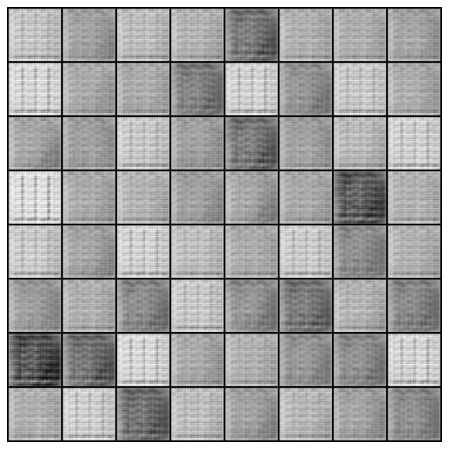

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/2]
- E_loss: 0.1855

[1/100][1/2]
- E_loss: 0.1242

[2/100][0/2]
- E_loss: 0.2885

[2/100][1/2]
- E_loss: 0.7585

[3/100][0/2]
- E_loss: 0.6674

[3/100][1/2]
- E_loss: 0.2099

[4/100][0/2]
- E_loss: 0.3776

[4/100][1/2]
- E_loss: 0.2047

[5/100][0/2]
- E_loss: 0.1820

[5/100][1/2]
- E_loss: 0.1810

[6/100][0/2]
- E_loss: 0.2148

[6/100][1/2]
- E_loss: 0.2205

[7/100][0/2]
- E_loss: 0.2065

[7/100][1/2]
- E_loss: 0.1438

[8/100][0/2]
- E_loss: 0.1303

[8/100][1/2]
- E_loss: 0.1747

[9/100][0/2]
- E_loss: 0.1578

[9/100][1/2]
- E_loss: 0.1690

[10/100][0/2]
- E_loss: 0.1408

[10/100][1/2]
- E_loss: 0.1355

[11/100][0/2]
- E_loss: 0.0977

[11/100][1/2]
- E_loss: 0.1090

[12/100][0/2]
- E_loss: 0.1030

[12/100][1/2]
- E_loss: 0.0998

[13/100][0/2]
- E_loss: 0.0961

[13/100][1/2]
- E_loss: 0.0912

[14/100][0/2]
- E_loss: 0.0795

[14/100][1/2]
- E_loss: 0.1128

[15/100][0/2]
- E_loss: 0.0833

[15/100][1/2]
- E_loss: 0.1080

[16/100][0/2]
- E_loss: 0.0913

[16/100][1/2]
- E_loss: 0.

# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

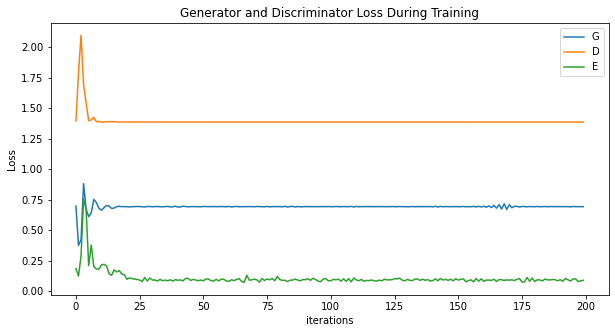

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, #test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

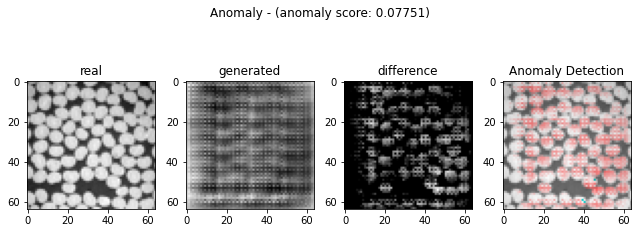

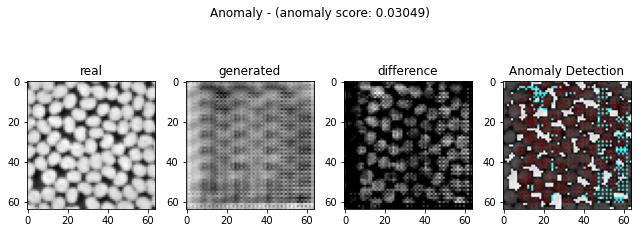

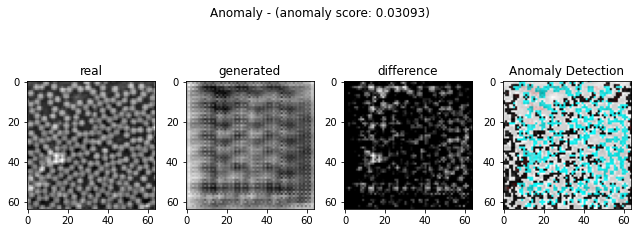

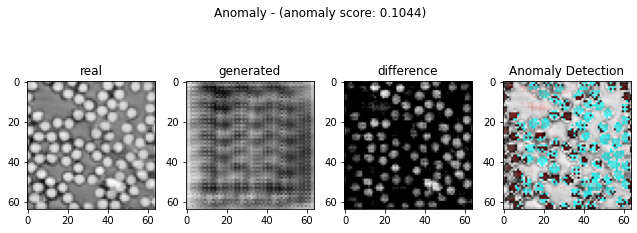

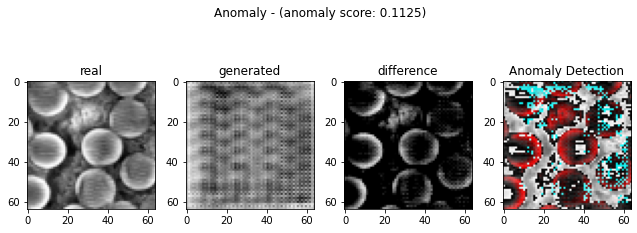

...

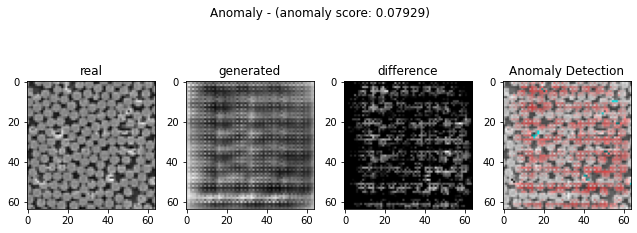

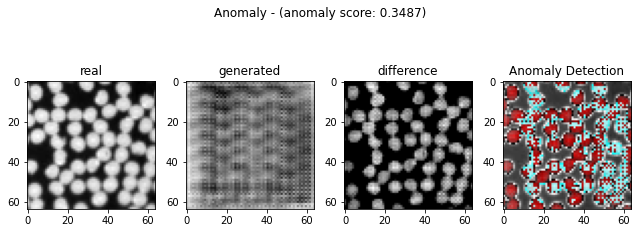

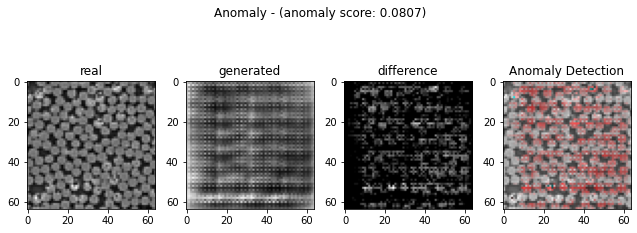

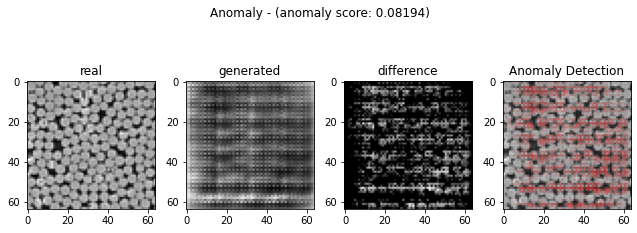

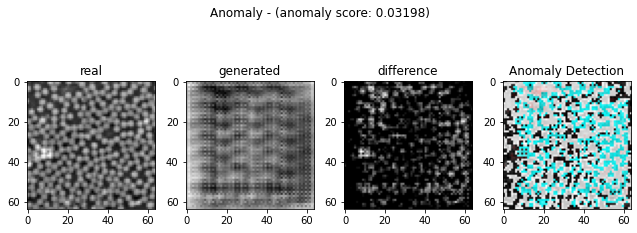

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.45898438 0.60717773 0.47705078 0.42211914 0.48193359 0.48706055
 0.52490234 0.59619141 0.42919922 0.56005859 0.33203125 0.41040039
 0.45214844 0.5300293  0.56811523 0.40698242 0.45532227 0.47485352
 0.27050781 0.47290039 0.43139648 0.44873047 0.52636719 0.42651367
 0.54638672 0.42602539 0.60351562 0.55712891 0.58666992 0.50390625
 0.45751953 0.47729492 0.53833008 0.47631836 0.56982422 0.45361328
 0.51928711 0.45288086 0.48486328 0.45825195 0.47070312 0.53881836
 0.49023438 0.46240234 0.50830078 0.55615234 0.51245117 0.50708008
 0.48217773 0.54345703 0.66308594 0.44897461 0.31396484 0.46655273
 0.60327148 0.50708008 0.51733398 0.46362305 0.46533203 0.48144531]


In [19]:
sum(diff_fraction) / len(diff_fraction)

0.4894205729166667

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[0.1639261339359961, 0.042099358037420875, 0.08163923010325416, 0.03538735737692578, 0.08314316638871955, 0.10447314875435748, -0.0059310790063957335, -0.01833874219543771, 0.07120925764219005, 0.07644662226773863, -0.05965856257071764, 0.14174131530201514, 0.07684002541172963, 0.06539237509710998, 0.07610779583471346, 0.13824055099462373, 0.11579624481457831, 0.0974413305178255, 0.36419589918939, 0.11757360982425416, 0.09657524065221304, 0.01466434994271041, 0.004707430580729092, 0.05077274177635448, 0.07895332318880019, 0.017891721310648735, -0.009338171927715948, 0.07139478168213742, 0.057744272377098047, -0.03741358276876498, 0.09450193170040029, 0.07694048972332039, -0.016107243755392922, 0.09863993688334427, -0.012865707451061553, 0.11112480224337642, 0.0028005997016048306, 0.14396054621831933, -0.005598992856713787, 0.06746859548397649, 0.10900379211548034, 0.06583705440016606, 0.06448779807024474, 0.10853842736628595, -0.011788478193577888, 0.0144018144806369, 0.082067161782116

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

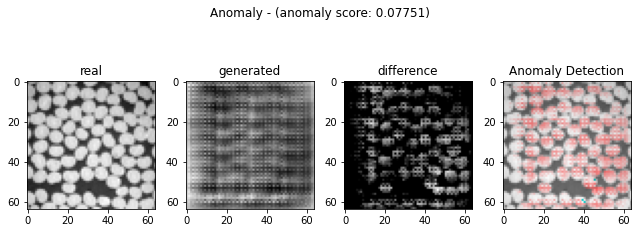

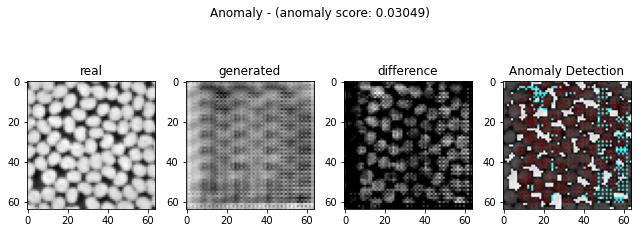

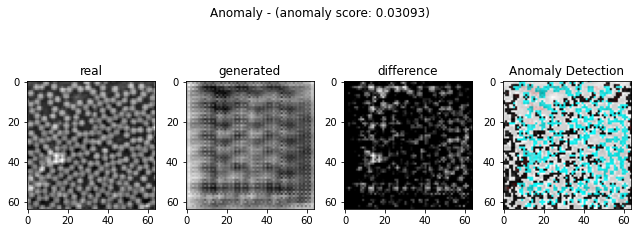

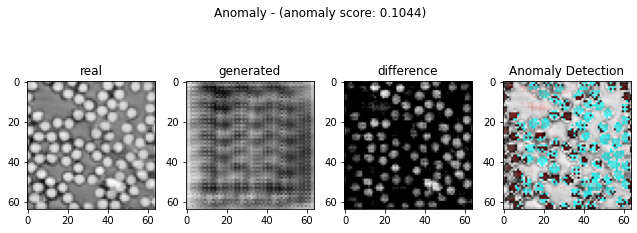

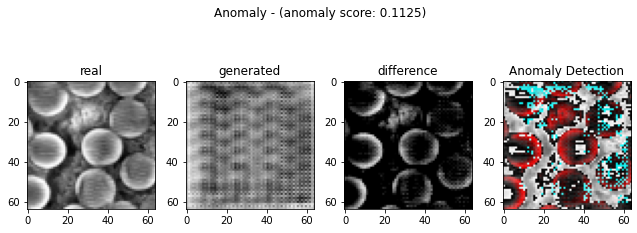

...

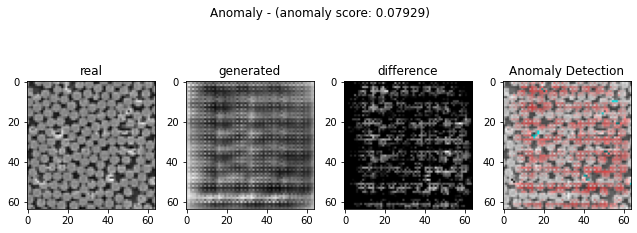

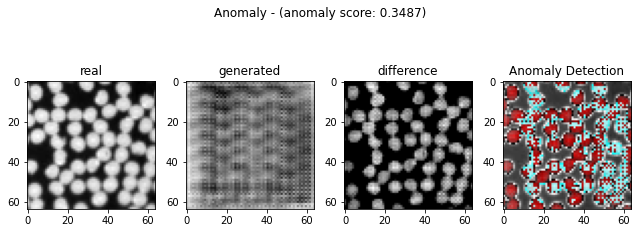

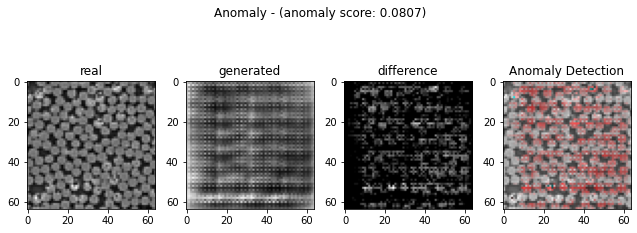

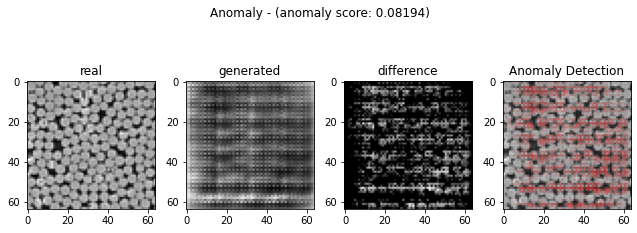

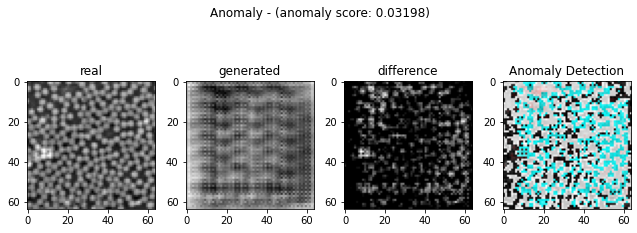

In [27]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [28]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.45898438 0.60717773 0.47705078 0.42211914 0.48193359 0.48706055
 0.52490234 0.59619141 0.42919922 0.56005859 0.33203125 0.41040039
 0.45214844 0.5300293  0.56811523 0.40698242 0.45532227 0.47485352
 0.27050781 0.47290039 0.43139648 0.44873047 0.52636719 0.42651367
 0.54638672 0.42602539 0.60351562 0.55712891 0.58666992 0.50390625
 0.45751953 0.47729492 0.53833008 0.47631836 0.56982422 0.45361328
 0.51928711 0.45288086 0.48486328 0.45825195 0.47070312 0.53881836
 0.49023438 0.46240234 0.50830078 0.55615234 0.51245117 0.50708008
 0.48217773 0.54345703 0.66308594 0.44897461 0.31396484 0.46655273
 0.60327148 0.50708008 0.51733398 0.46362305 0.46533203 0.48144531]


In [29]:
cal_corr_coeffis()

print(corr_coeffis)

[0.1639261339359961, 0.042099358037420875, 0.08163923010325416, 0.03538735737692578, 0.08314316638871955, 0.10447314875435748, -0.0059310790063957335, -0.01833874219543771, 0.07120925764219005, 0.07644662226773863, -0.05965856257071764, 0.14174131530201514, 0.07684002541172963, 0.06539237509710998, 0.07610779583471346, 0.13824055099462373, 0.11579624481457831, 0.0974413305178255, 0.36419589918939, 0.11757360982425416, 0.09657524065221304, 0.01466434994271041, 0.004707430580729092, 0.05077274177635448, 0.07895332318880019, 0.017891721310648735, -0.009338171927715948, 0.07139478168213742, 0.057744272377098047, -0.03741358276876498, 0.09450193170040029, 0.07694048972332039, -0.016107243755392922, 0.09863993688334427, -0.012865707451061553, 0.11112480224337642, 0.0028005997016048306, 0.14396054621831933, -0.005598992856713787, 0.06746859548397649, 0.10900379211548034, 0.06583705440016606, 0.06448779807024474, 0.10853842736628595, -0.011788478193577888, 0.0144018144806369, 0.082067161782116

---

# anomaly detection 이미지 추출

In [30]:
anomaly_imgs

[array([[[188, 188, 188],
         [192, 192, 192],
         [194, 194, 194],
         ...,
         [180, 180, 180],
         [186, 186, 186],
         [186, 186, 186]],
 
        [[136, 136, 136],
         [180, 180, 180],
         [182, 182, 182],
         ...,
         [190, 190, 190],
         [184, 184, 184],
         [188, 188, 188]],
 
        [[186, 186, 186],
         [180, 180, 180],
         [127, 127, 127],
         ...,
         [188, 188, 188],
         [184, 184, 184],
         [190, 190, 190]],
 
        ...,
 
        [[180, 180, 180],
         [206, 206, 206],
         [206, 206, 206],
         ...,
         [226, 226, 226],
         [232, 232, 232],
         [150, 150, 150]],
 
        [[172, 172, 172],
         [113, 113, 113],
         [198, 198, 198],
         ...,
         [228, 228, 228],
         [218, 218, 218],
         [166, 166, 166]],
 
        [[188, 188, 188],
         [166, 166, 166],
         [222, 222, 222],
         ...,
         [226, 226, 226],
  

# 이미지 저장 함수

In [31]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [32]:
save_imgs("./anomaly_imgs", anomaly_imgs)

image saving complete


---

# 티타늄(Ti64) 상대 밀도 계산

In [33]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)

[2.03330078 2.68979736 2.11333496 1.86998779 2.13496582 2.15767822
 2.32531738 2.64112793 1.90135254 2.48105957 1.47089844 1.81807373
 2.00301758 2.34802979 2.51675049 1.80293213 2.01707764 2.10360107
 1.19834961 2.09494873 1.91108643 1.98787598 2.33180664 1.88945557
 2.42049316 1.88729248 2.67357422 2.46808105 2.59894775 2.23230469
 2.02681152 2.1144165  2.38480225 2.11009033 2.52432129 2.00950684
 2.30044189 2.00626221 2.14794434 2.03005615 2.08521484 2.38696533
 2.17173828 2.04844238 2.25177246 2.46375488 2.27015869 2.24636475
 2.13604736 2.40751465 2.9374707  1.98895752 1.39086426 2.06682861
 2.67249268 2.24636475 2.29178955 2.0538501  2.0614209  2.13280273]
